# Assignment 8
In this assignment, you will use clustering on different data sets.  In each case, you want to determine the number of clusters I used to create the set and the center of the clusters. 

Remember, it is easy to look for too many clusters. You may want to use graphs of the data to help you find your answer.  You may want to use dimension reduction as well.

In each case, I have included code to read in the data set. You will need to add your code and notes after. Explain, how you decided on your answer.

The features in the data sets are x, and y, with z, w, v as needed. 
None of the data sets have missing features.

## Data Set 1

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

ds_1 = pd.read_csv("ds1.csv")
ds_1.describe()
ds_1.head()

,Unnamed: 0,x,y
0,0,5.029624,0.220861
1,1,0.227640,0.992497
2,2,0.753142,0.036561
3,3,5.071101,0.388116
4,4,5.192058,0.320974


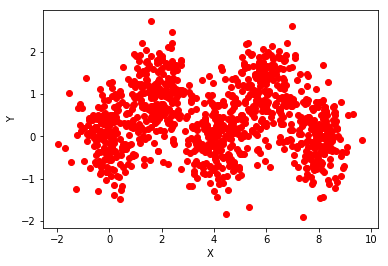

In [2]:
plt.scatter(ds_1['x'], ds_1['y'], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

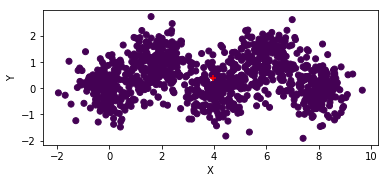

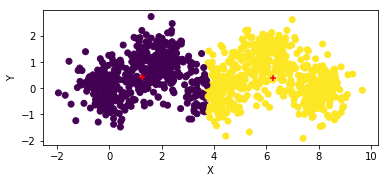

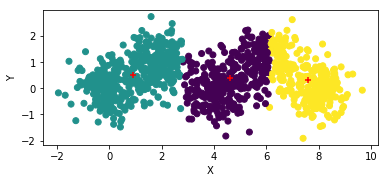

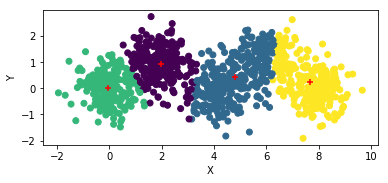

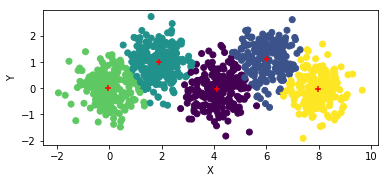

...

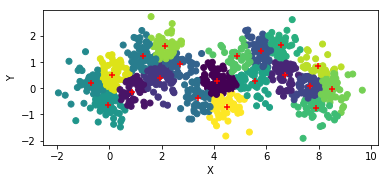

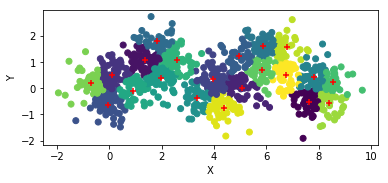

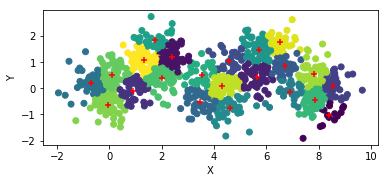

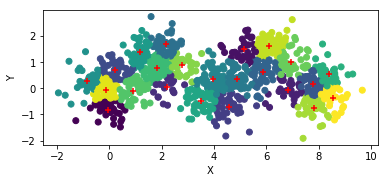

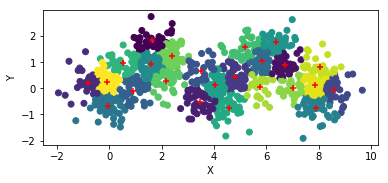

The lowest distortion is  186.93274020122652
This distortion was made with  24  clusters.


In [3]:

maxCluster = 25
Xx = ds_1[['x', 'y']]
def printClusterGraphs(X,maxClusters,dataSet):
    lowestInertia = 999999999999999999999999999999999999999999999999999999999999999999
    for i in range(1,maxClusters):
        kmeans_classifier = KMeans(n_clusters=i)
        kmeans_classifier.fit(X)
        if (kmeans_classifier.inertia_ < lowestInertia):
            lowestInertia = kmeans_classifier.inertia_
            numClusters = i
            bestClassifier = kmeans_classifier
        cluster_x = [x for [x,y] in kmeans_classifier.cluster_centers_]
        cluster_y = [y for [x,y] in kmeans_classifier.cluster_centers_]
        plt.scatter(dataSet['x'], dataSet['y'], c=kmeans_classifier.labels_)
        plt.scatter(cluster_x, cluster_y, marker="+", color="red")
        plt.xlabel("X")
        plt.ylabel("Y")
        plt.axis("scaled")
        plt.show()
    print("The lowest distortion is ", lowestInertia)
    print("This distortion was made with ", numClusters, " clusters.")
    #print("The centroids are ", kmeans_classifier.cluster_centers_)
    #print("Assignments are: ")
    #print(kmeans_classifier.labels_)


printClusterGraphs(Xx,maxCluster,ds_1)

##  #lower the better. so i would assume we should find the number of clusters that brings this to the lowest point

my first guess is 2 clusters. my second guess is 5 clusters. I determined this by plotting kmeans operations on the data with clusters from 1 to 100. Then i visually looked for the most tightly clustered points that were closest to 1. The reason i looked closer to 1 is because i would assume that hoot made the cluster numbers somewhat small

## Data Set 2

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

ds_2 = pd.read_csv("ds2.csv")
ds_2.describe()


,Unnamed: 0,x,y
count,1058.000000,1058.000000,1058.000000
mean,528.500000,-0.072163,-0.052329
std,305.562596,1.411131,1.382415
min,0.000000,-3.443071,-3.356230
25%,264.250000,-0.927563,-0.875309
50%,528.500000,-0.041688,-0.039791
75%,792.750000,0.675385,0.724247
max,1057.000000,3.478413,3.243118


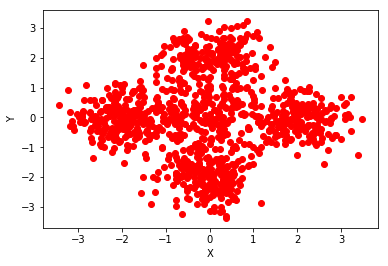

In [5]:
plt.scatter(ds_2['x'], ds_2['y'], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

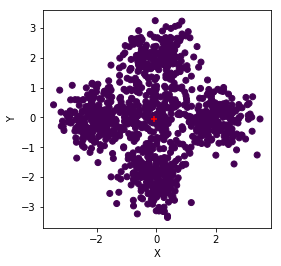

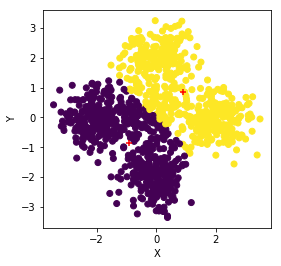

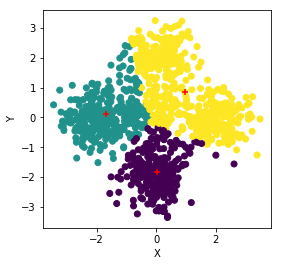

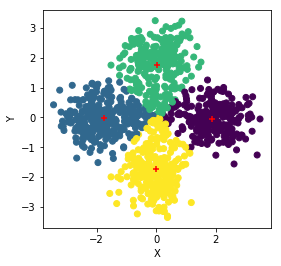

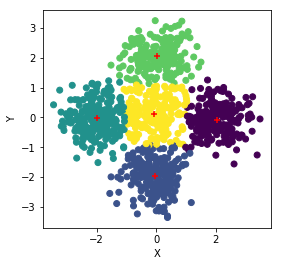

...

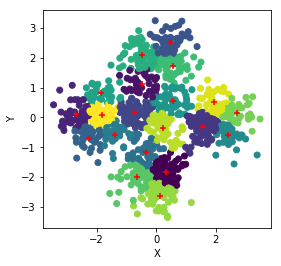

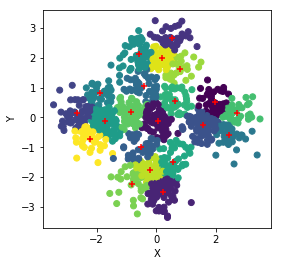

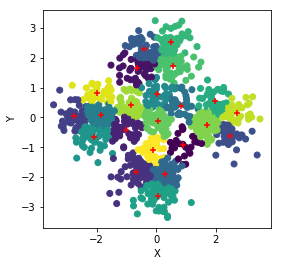

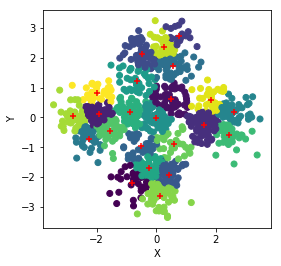

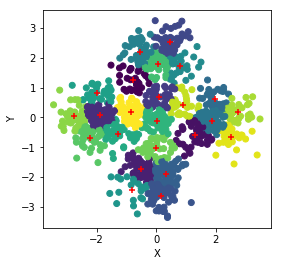

The lowest distortion is  147.65083183925805
This distortion was made with  24  clusters.


In [6]:
maxCluster = 25
Xx = ds_2[['x', 'y']]
printClusterGraphs(Xx,maxCluster,ds_2)

Your Notes here: my first guess is 5 clusters becasue of how tightly grouped it looks. my second guess is 4 clusters. 

## Data Set 3

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

ds_3 = pd.read_csv("ds3.csv")
ds_3.describe()

,Unnamed: 0,x,y,z
count,1446.000000,1446.000000,1446.000000,1446.000000
mean,722.500000,2.135297,2.186688,0.863240
std,417.568557,1.110837,1.105736,1.091547
min,0.000000,-0.707973,-0.583159,-1.481229
25%,361.250000,1.107109,1.137856,-0.034578
50%,722.500000,2.406967,2.484344,0.567206
75%,1083.750000,3.099830,3.110648,1.880826
max,1445.000000,4.553720,4.450822,3.531906


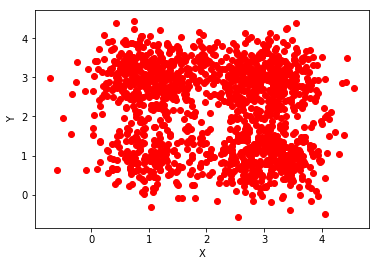

In [8]:
plt.scatter(ds_3['x'], ds_3['y'], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

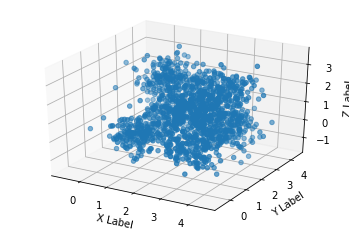

In [9]:
fig = plt.figure()
# HERE IS WHERE WE CREATE THE 3D PLOT
ax = fig.add_subplot(111, projection='3d')
ax.scatter(ds_3["x"], ds_3["y"], ds_3["z"])
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

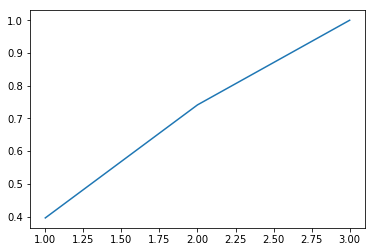

In [10]:
X = ds_3[['x', 'y','z']]


from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X)
cumulative_sums = np.cumsum(pca.explained_variance_ratio_)


import matplotlib.pyplot as plt
d_values = [i+1 for i in range(0,len(cumulative_sums))]
plt.plot(d_values, cumulative_sums)
plt.show()



Your Notes here: looks like the 2 is where the most change happens. so i should reduce it to 2 dimensions.

Pipeline(memory=None,
     steps=[('pca', PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('KMeans', KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0))])


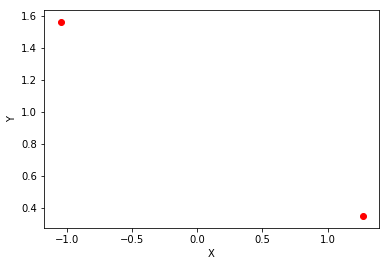

In [11]:
from sklearn.pipeline import Pipeline

ds_3_pca = PCA(n_components=2)
ds_3_model = KMeans(n_clusters=3)

myPipe = Pipeline([
    ('pca', ds_3_pca),
    ('KMeans', ds_3_model)
])

print(myPipe)
myPipe.fit(X)
mXtransformed = ds_3_pca.transform(X)
plt.scatter(mXtransformed[0],mXtransformed[1], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

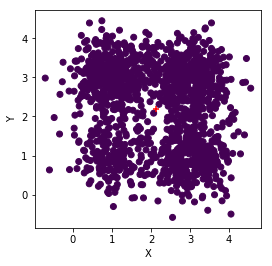

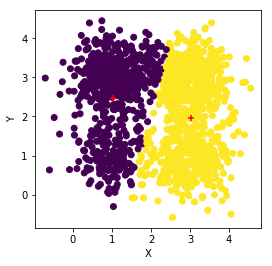

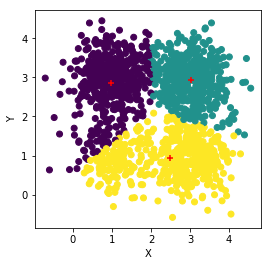

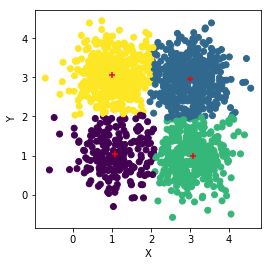

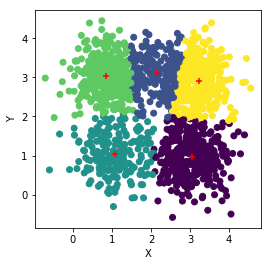

...

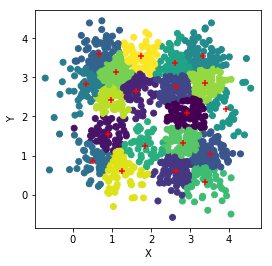

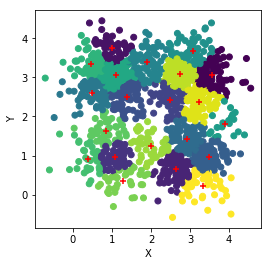

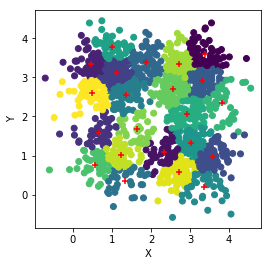

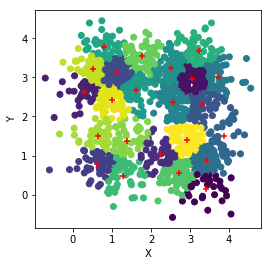

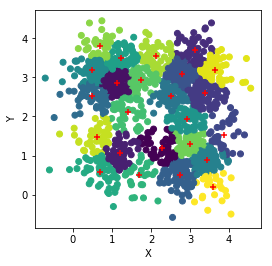

The lowest distortion is  153.3134165695937
This distortion was made with  24  clusters.


In [13]:
Xx = ds_3[['x', 'y']]
printClusterGraphs(Xx,maxCluster,ds_3)

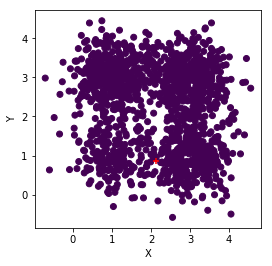

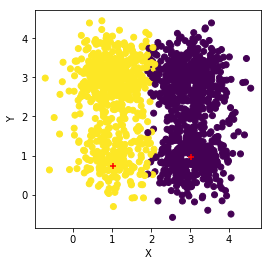

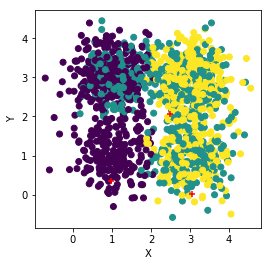

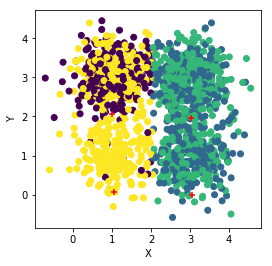

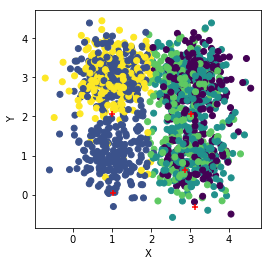

...

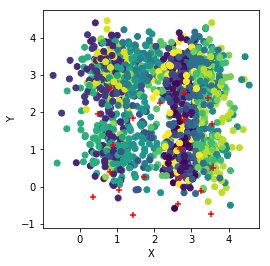

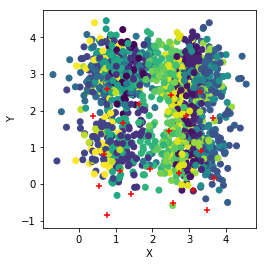

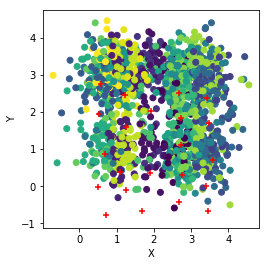

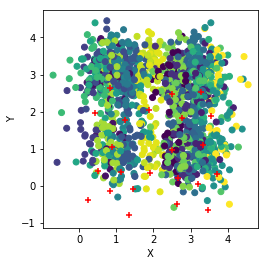

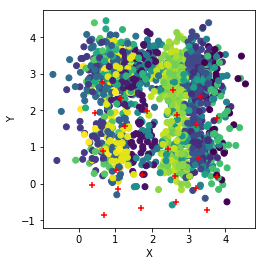

The lowest distortion is  150.43304164401206
This distortion was made with  24  clusters.


In [14]:
Xx = ds_3[['x', 'z']]
printClusterGraphs(Xx,maxCluster,ds_3)

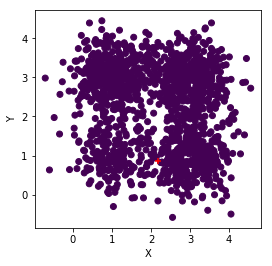

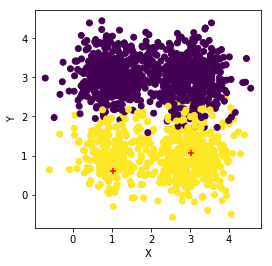

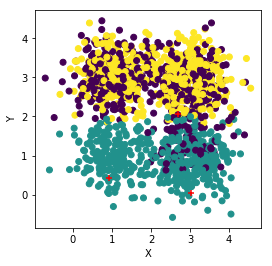

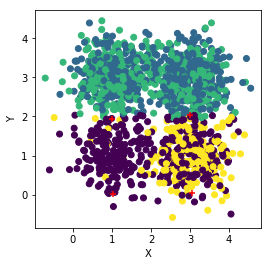

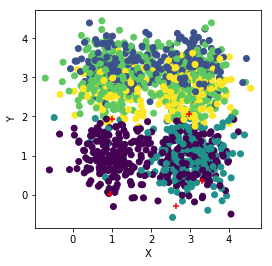

...

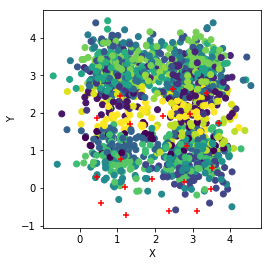

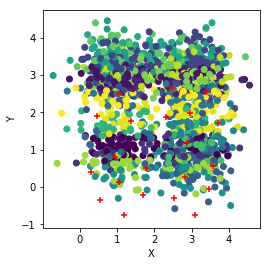

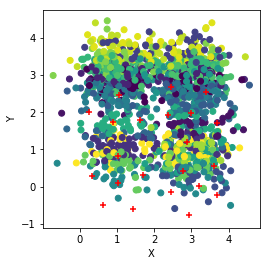

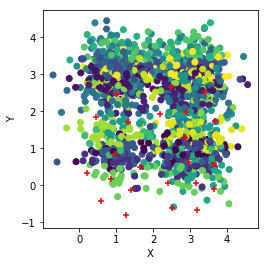

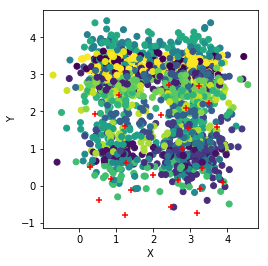

The lowest distortion is  146.5555231787932
This distortion was made with  24  clusters.


In [15]:
Xx = ds_3[['y', 'z']]
printClusterGraphs(Xx,maxCluster,ds_3)

In [ ]:
looks like 4 clusters. didnt see any other better fitting ones.

## Data Set 4

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

ds_4 = pd.read_csv("ds4.csv")
ds_4.describe()

,Unnamed: 0,x,y,z
count,1063.000000,1063.000000,1063.000000,1063.000000
mean,531.000000,0.013664,-0.069374,2.510416
std,307.005972,1.205685,1.276449,1.673482
min,0.000000,-4.776314,-5.842772,-1.260201
25%,265.500000,-0.701625,-0.798814,1.360146
50%,531.000000,0.070542,-0.058408,2.681603
75%,796.500000,0.665300,0.592984,4.009770
max,1062.000000,4.834158,5.554055,5.342099


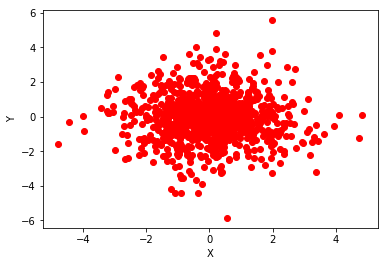

In [17]:
plt.scatter(ds_4['x'], ds_4['y'], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

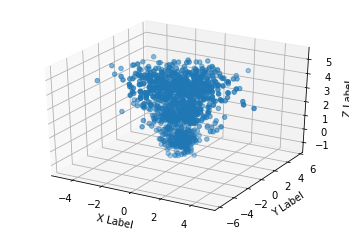

In [36]:
fig = plt.figure()
# HERE IS WHERE WE CREATE THE 3D PLOT
ax = fig.add_subplot(111, projection='3d')
ax.scatter(ds_4["x"], ds_4["y"], ds_4["z"])
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

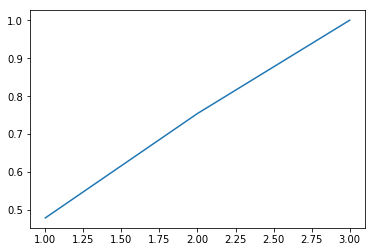

Pipeline(memory=None,
     steps=[('pca', PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('KMeans', KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0))])


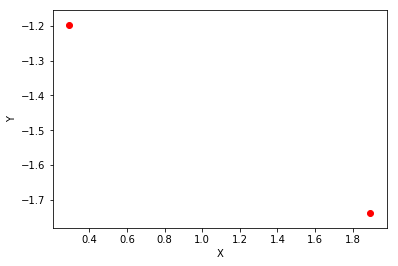

In [43]:
X = ds_4[['x', 'y','z']]


from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X)
cumulative_sums = np.cumsum(pca.explained_variance_ratio_)


import matplotlib.pyplot as plt
d_values = [i+1 for i in range(0,len(cumulative_sums))]
plt.plot(d_values, cumulative_sums)
plt.show()


ds_3_pca = PCA(n_components=2)
ds_3_model = KMeans(n_clusters=3)

myPipe = Pipeline([
    ('pca', ds_3_pca),
    ('KMeans', ds_3_model)
])

print(myPipe)
myPipe.fit(X)
mXtransformed = ds_3_pca.transform(X)
plt.scatter(mXtransformed[0],mXtransformed[1], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


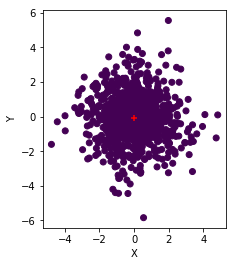

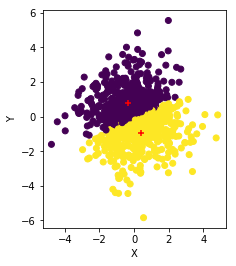

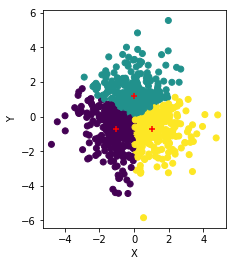

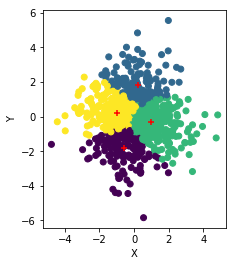

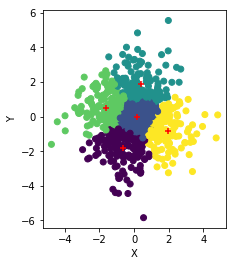

...

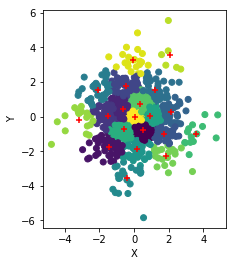

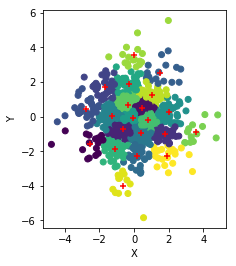

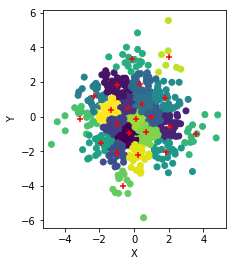

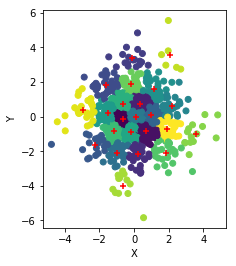

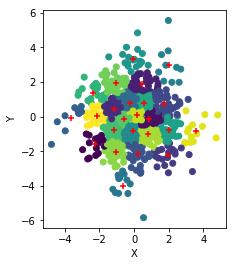

The lowest distortion is  243.4287038558552
This distortion was made with  24  clusters.


In [18]:
Xx = ds_4[['x', 'y']]
printClusterGraphs(Xx,maxCluster,ds_4)

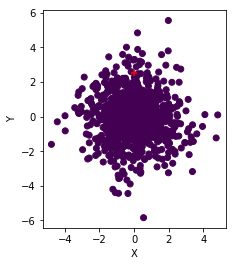

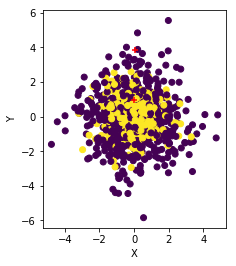

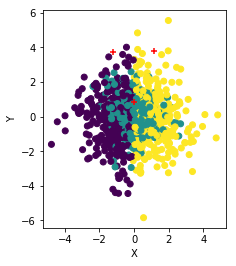

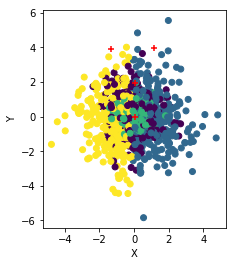

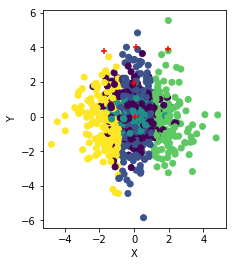

...

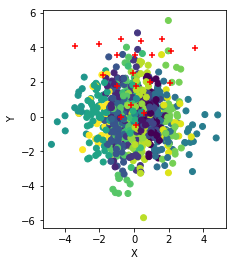

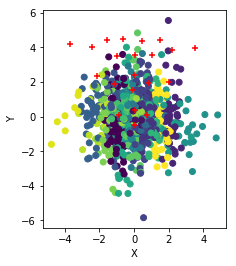

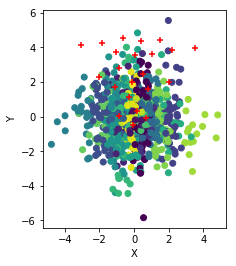

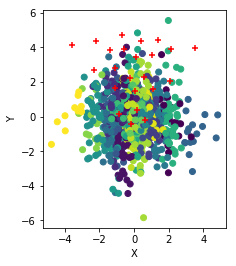

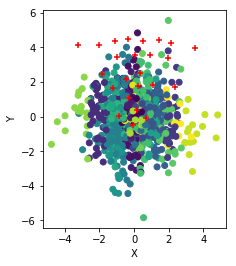

The lowest distortion is  189.67071909473987
This distortion was made with  24  clusters.


In [19]:
Xx = ds_4[['x', 'z']]
printClusterGraphs(Xx,maxCluster,ds_4)

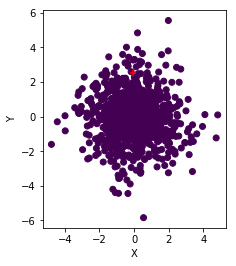

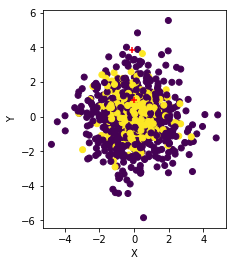

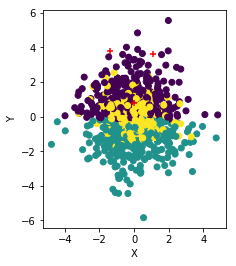

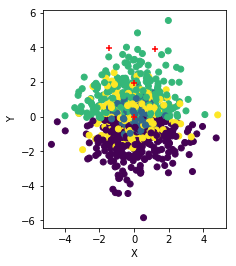

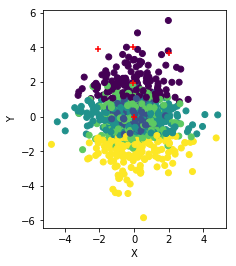

...

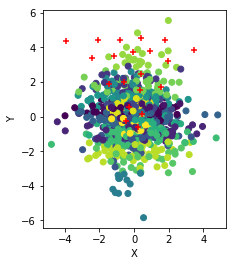

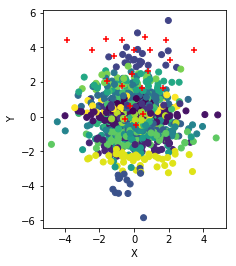

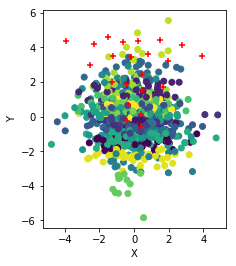

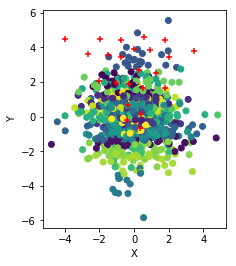

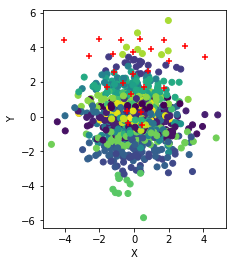

The lowest distortion is  193.7111991251651
This distortion was made with  24  clusters.


In [20]:
Xx = ds_4[['y', 'z']]
printClusterGraphs(Xx,maxCluster,ds_4)

Your Notes here: no idea. i guess 4

## Data Set 5

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

ds_5 = pd.read_csv("ds5.csv")
ds_5.describe()

,Unnamed: 0,x,y,z,w
count,629.00000,629.000000,629.000000,629.000000,629.000000
mean,314.00000,3.852841,3.693570,2.130011,2.025688
std,181.72094,2.225874,2.213680,1.055294,1.110188
min,0.00000,-0.314006,0.009790,0.001995,0.000969
25%,157.00000,1.909863,2.010609,1.384115,1.035640
50%,314.00000,3.940207,3.387014,2.121115,2.064878
75%,471.00000,5.497202,5.399756,3.031890,2.978383
max,628.00000,7.998263,7.994215,3.993584,3.992093


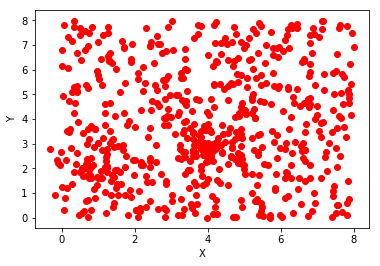

In [22]:
plt.scatter(ds_5['x'], ds_5['y'], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

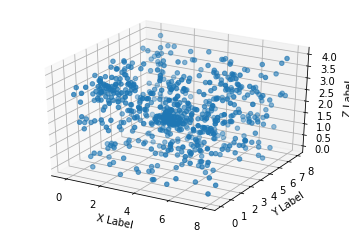

In [39]:
fig = plt.figure()
# HERE IS WHERE WE CREATE THE 3D PLOT
ax = fig.add_subplot(111, projection='3d')
ax.scatter(ds_5["x"], ds_5["y"], ds_5["z"])
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

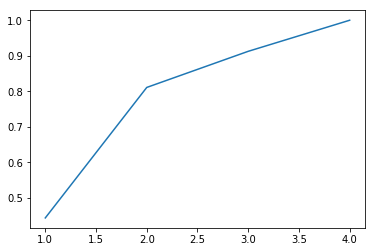

Pipeline(memory=None,
     steps=[('pca', PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('KMeans', KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0))])


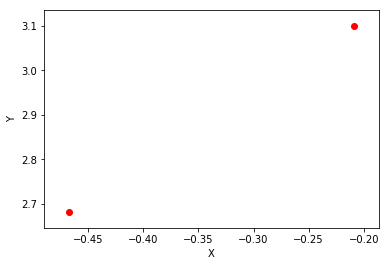

In [55]:
X = ds_5[['x', 'y','z','w']]


from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X)
cumulative_sums = np.cumsum(pca.explained_variance_ratio_)


import matplotlib.pyplot as plt
d_values = [i+1 for i in range(0,len(cumulative_sums))]
plt.plot(d_values, cumulative_sums)
plt.show()


ds_3_pca = PCA(n_components=2)
ds_3_model = KMeans(n_clusters=3)

myPipe = Pipeline([
    ('pca', ds_3_pca),
    ('KMeans', ds_3_model)
])

print(myPipe)
myPipe.fit(X)
mXtransformed = ds_3_pca.transform(X)
plt.scatter(mXtransformed[0],mXtransformed[1], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


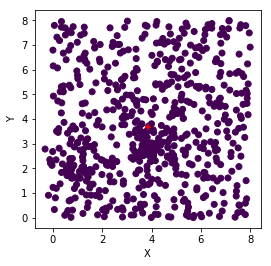

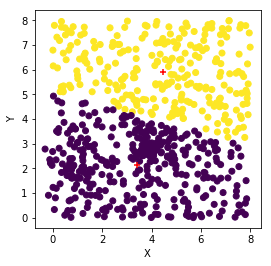

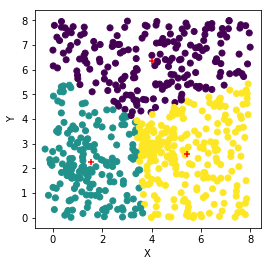

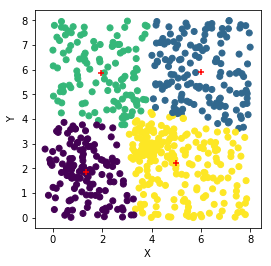

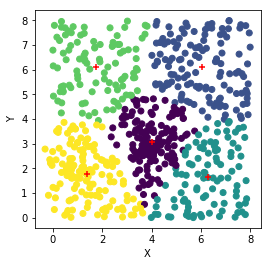

...

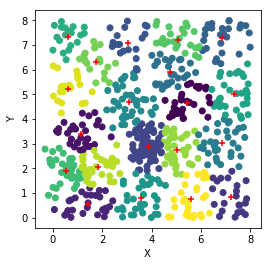

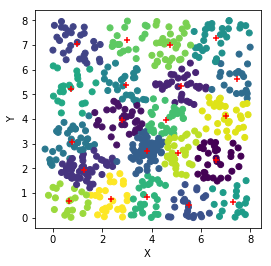

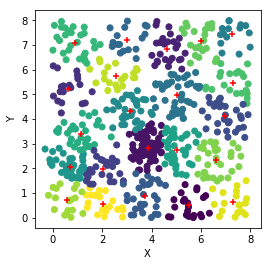

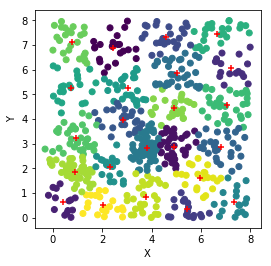

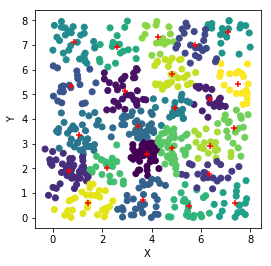

The lowest distortion is  244.8955654386737
This distortion was made with  24  clusters.


In [24]:
Xx = ds_5[['x', 'y']]
printClusterGraphs(Xx,maxCluster,ds_5)

Your Notes here: no idea. i guess 4

## Data Set 6

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

ds_6 = pd.read_csv("ds6.csv")
ds_6.describe()

,Unnamed: 0,x,y,z,w
count,1311.000000,1311.000000,1311.000000,1311.000000,1311.000000
mean,655.000000,-0.028575,0.095670,0.423992,0.777860
std,378.597412,0.798600,0.797749,0.588330,0.798313
min,0.000000,-1.932087,-2.032064,-1.134788,-1.205740
25%,327.500000,-0.645779,-0.485203,-0.050217,0.111740
50%,655.000000,-0.036785,0.056301,0.297080,0.774602
75%,982.500000,0.560622,0.760272,0.936482,1.332307
max,1310.000000,2.076697,2.262453,2.132456,2.514227


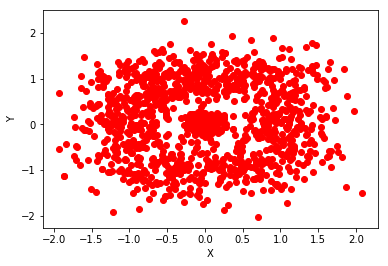

In [26]:
plt.scatter(ds_6['x'], ds_6['y'], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

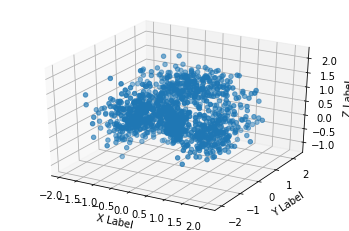

In [40]:
fig = plt.figure()
# HERE IS WHERE WE CREATE THE 3D PLOT
ax = fig.add_subplot(111, projection='3d')
ax.scatter(ds_6["x"], ds_6["y"], ds_6["z"])
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

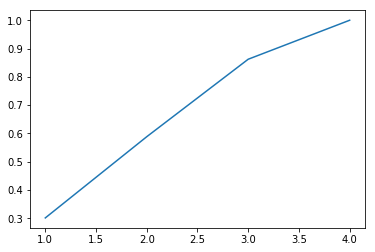

Pipeline(memory=None,
     steps=[('pca', PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('KMeans', KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0))])


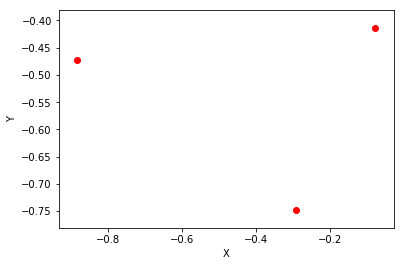

In [54]:
X = ds_6[['x', 'y','z','w']]


from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X)
cumulative_sums = np.cumsum(pca.explained_variance_ratio_)


import matplotlib.pyplot as plt
d_values = [i+1 for i in range(0,len(cumulative_sums))]
plt.plot(d_values, cumulative_sums)
plt.show()


ds_3_pca = PCA(n_components=3)
ds_3_model = KMeans(n_clusters=3)

myPipe = Pipeline([
    ('pca', ds_3_pca),
    ('KMeans', ds_3_model)
])

print(myPipe)
myPipe.fit(X)
mXtransformed = ds_3_pca.transform(X)
plt.scatter(mXtransformed[0],mXtransformed[1], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


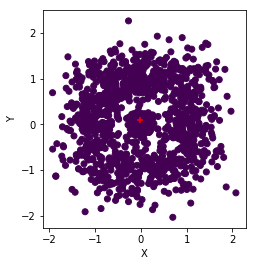

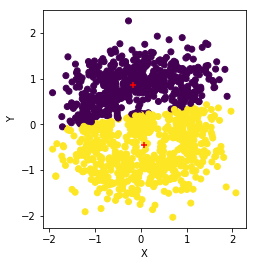

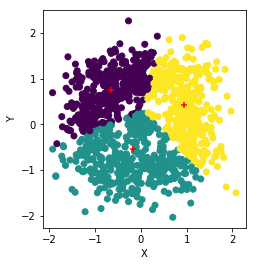

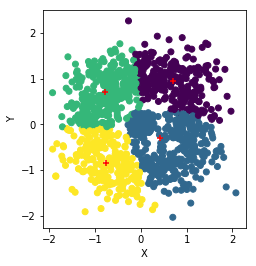

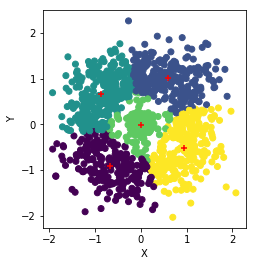

...

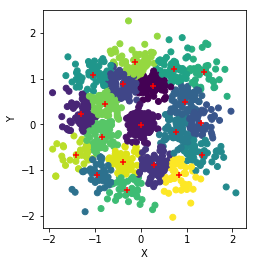

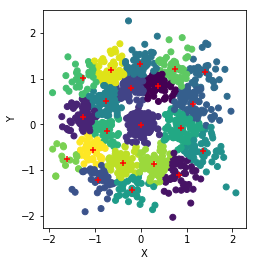

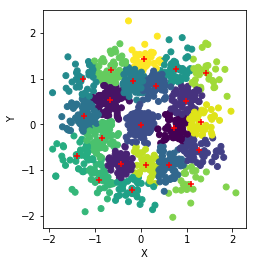

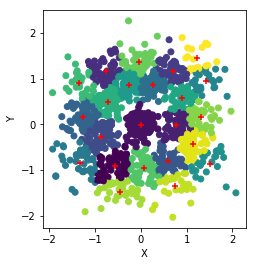

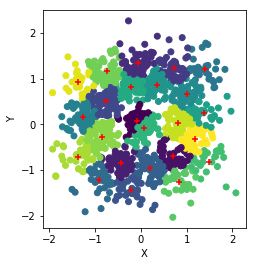

The lowest distortion is  80.30267571288746
This distortion was made with  24  clusters.


In [27]:
Xx = ds_6[['x', 'y']]
printClusterGraphs(Xx,maxCluster,ds_6)

Your Notes here: looks like 6 clusters. didnt see any other better fitting ones.

## Data Set 7
Note: This is the largest of the data sets.

In [28]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Read in a dataframe
ds_7 = pd.read_csv("ds7.csv")
ds_7.describe()




,x,y,z
count,9096.000000,9096.000000,9096.000000
mean,183.525478,-0.707410,5.658734
std,102.881140,33.895199,0.890856
min,0.010000,-88.810000,-1.460000
25%,92.740000,-21.955000,5.290000
50%,187.715000,-1.740000,5.910000
75%,271.375000,20.997500,6.280000
max,359.880000,89.580000,7.960000


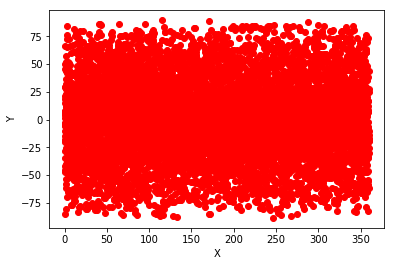

In [29]:
plt.scatter(ds_7['x'], ds_7['y'], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

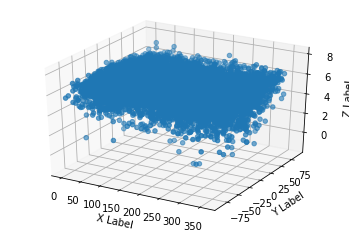

In [41]:
fig = plt.figure()
# HERE IS WHERE WE CREATE THE 3D PLOT
ax = fig.add_subplot(111, projection='3d')
ax.scatter(ds_7["x"], ds_7["y"], ds_7["z"])
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

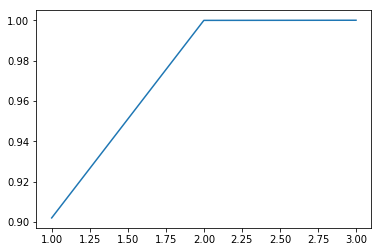

Pipeline(memory=None,
     steps=[('pca', PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('KMeans', KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0))])


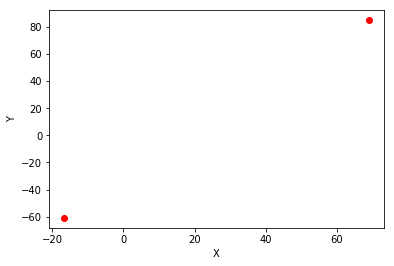

In [48]:
X = ds_7[['x', 'y','z']]


from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X)
cumulative_sums = np.cumsum(pca.explained_variance_ratio_)


import matplotlib.pyplot as plt
d_values = [i+1 for i in range(0,len(cumulative_sums))]
plt.plot(d_values, cumulative_sums)
plt.show()


ds_3_pca = PCA(n_components=2)
ds_3_model = KMeans(n_clusters=3)

myPipe = Pipeline([
    ('pca', ds_3_pca),
    ('KMeans', ds_3_model)
])

print(myPipe)
myPipe.fit(X)
mXtransformed = ds_3_pca.transform(X)
plt.scatter(mXtransformed[0],mXtransformed[1], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


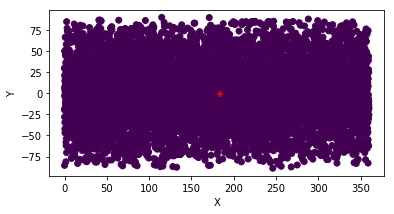

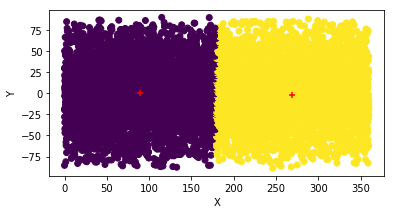

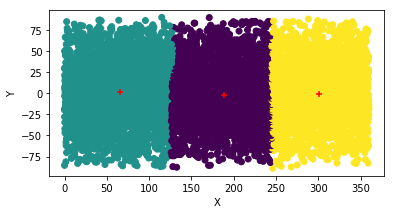

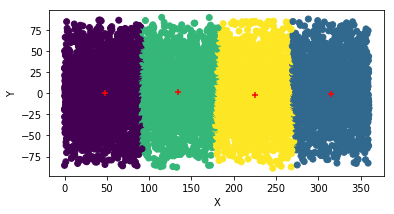

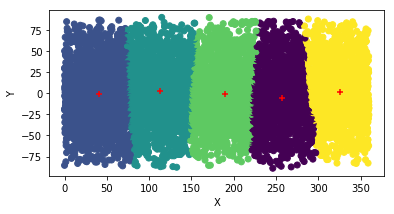

...

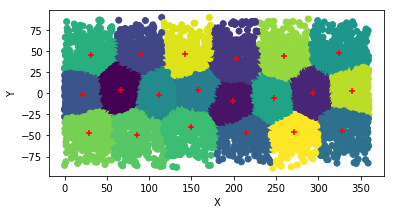

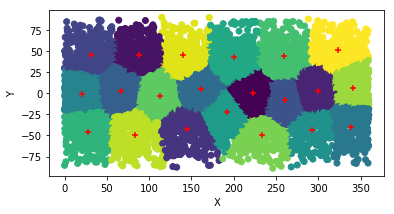

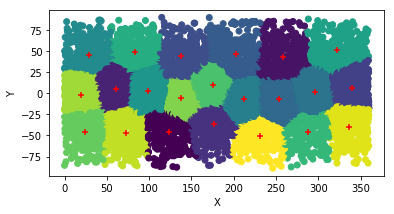

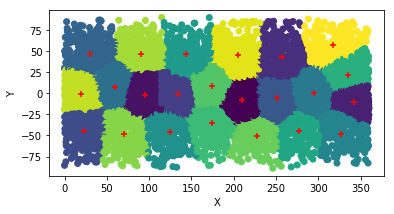

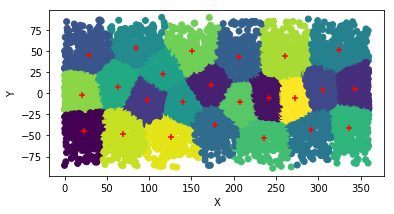

The lowest distortion is  3179090.4880077727
This distortion was made with  24  clusters.


In [30]:
Xx = ds_7[['x', 'y']]
printClusterGraphs(Xx,maxCluster,ds_7)

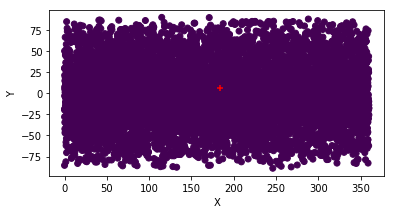

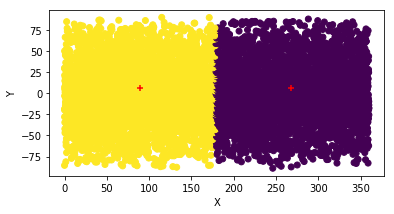

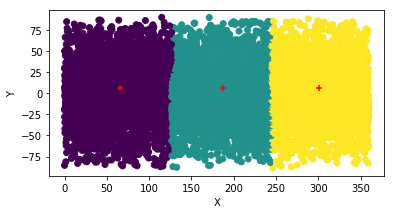

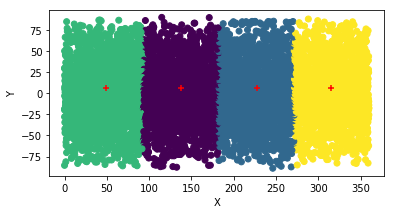

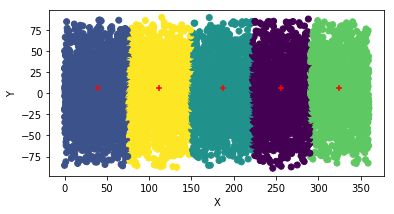

...

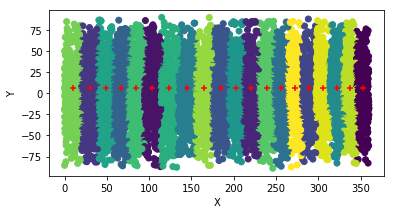

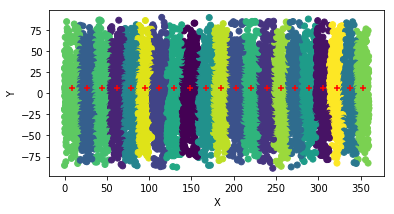

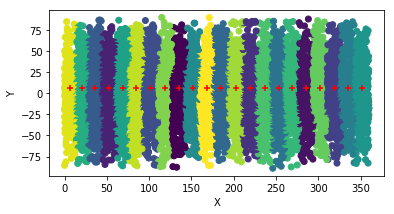

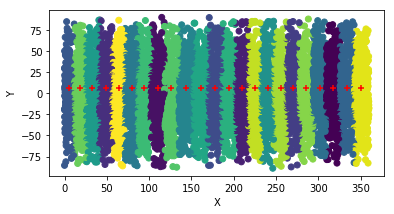

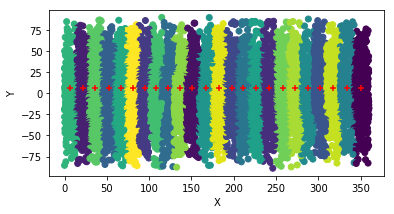

The lowest distortion is  177953.43105648295
This distortion was made with  24  clusters.


In [31]:
Xx = ds_7[['x', 'z']]
printClusterGraphs(Xx,maxCluster,ds_7)

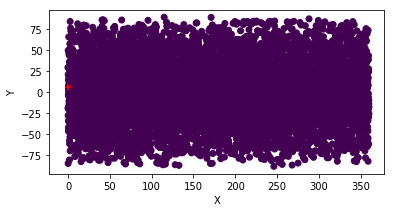

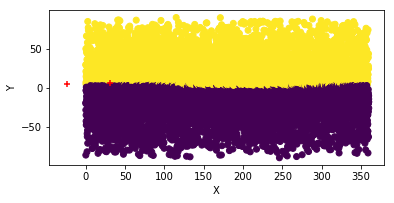

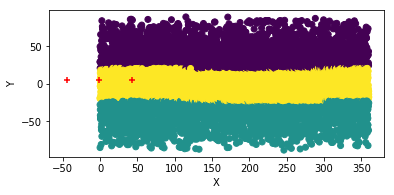

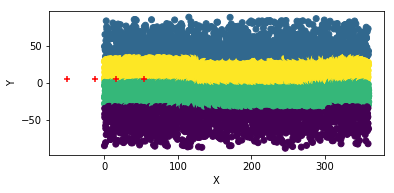

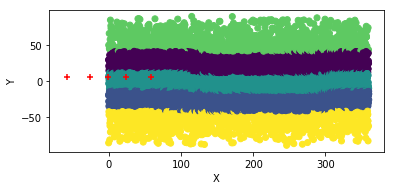

...

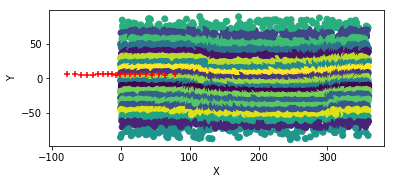

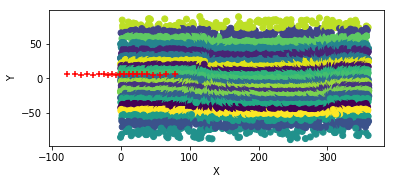

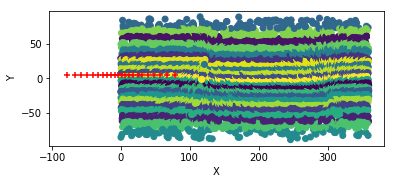

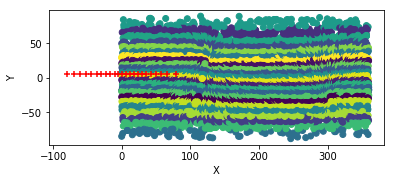

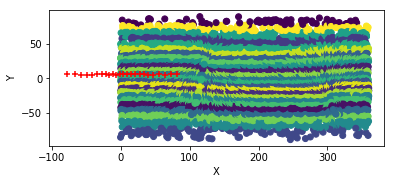

The lowest distortion is  40434.516167627145
This distortion was made with  24  clusters.


In [32]:
Xx = ds_7[['y', 'z']]
printClusterGraphs(Xx,maxCluster,ds_7)

Your Notes here: no idea. i guess 4

## Data Set 8
We have 5 features for this set.

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

ds_8 = pd.read_csv("ds8.csv")
ds_8.describe()

,Unnamed: 0,x,y,z,w,v
count,809.000000,809.000000,809.000000,809.000000,809.000000,809.000000
mean,404.000000,3.223118,2.790424,3.176740,6.013542,3.269495
std,233.682477,1.755361,1.764576,1.768306,0.814947,3.035994
min,0.000000,-0.825282,-0.726948,-0.782238,3.607506,-4.532641
25%,202.000000,1.689535,1.171706,1.508139,5.433439,0.513504
50%,404.000000,3.064805,2.708947,3.241645,6.009110,4.451023
75%,606.000000,4.818158,4.746279,4.922822,6.538243,5.430987
max,808.000000,6.980154,5.699592,5.811991,8.484737,9.037485


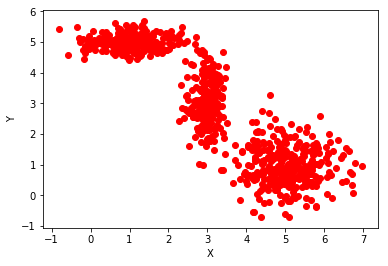

In [34]:
plt.scatter(ds_8['x'], ds_8['y'], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

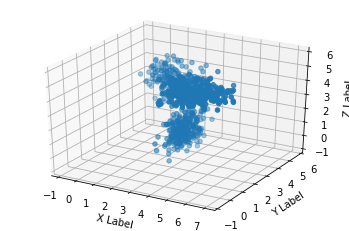

In [42]:
fig = plt.figure()
# HERE IS WHERE WE CREATE THE 3D PLOT
ax = fig.add_subplot(111, projection='3d')
ax.scatter(ds_8["x"], ds_8["y"], ds_8["z"])
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()

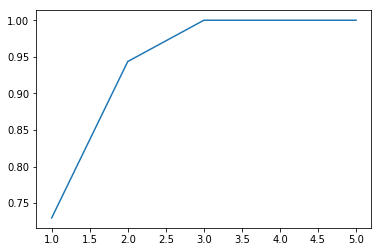

Pipeline(memory=None,
     steps=[('pca', PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('KMeans', KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0))])


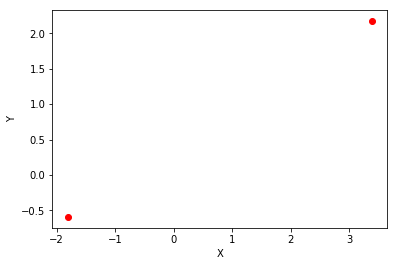

In [51]:
X = ds_8[['x', 'y','z','w','v']]


from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X)
cumulative_sums = np.cumsum(pca.explained_variance_ratio_)


import matplotlib.pyplot as plt
d_values = [i+1 for i in range(0,len(cumulative_sums))]
plt.plot(d_values, cumulative_sums)
plt.show()


ds_3_pca = PCA(n_components=2)
ds_3_model = KMeans(n_clusters=3)

myPipe = Pipeline([
    ('pca', ds_3_pca),
    ('KMeans', ds_3_model)
])

print(myPipe)
myPipe.fit(X)
mXtransformed = ds_3_pca.transform(X)
plt.scatter(mXtransformed[0],mXtransformed[1], color="red")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


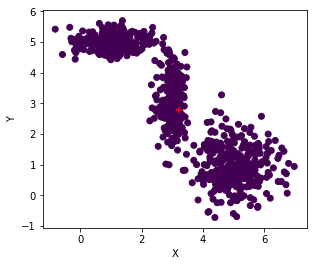

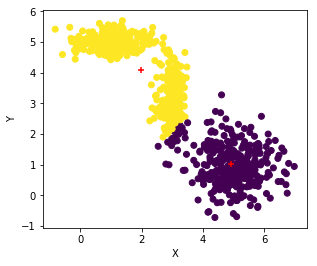

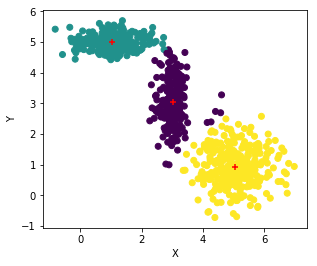

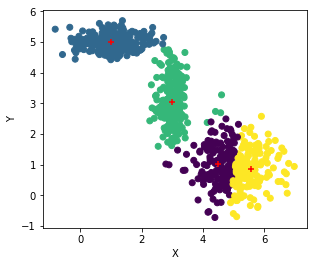

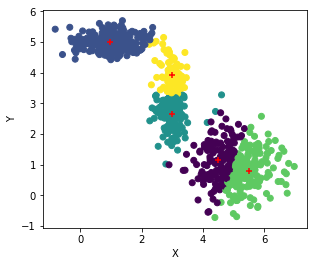

...

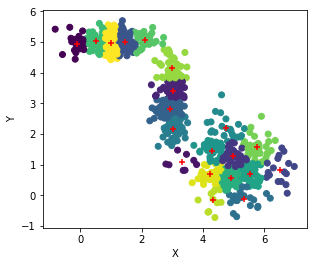

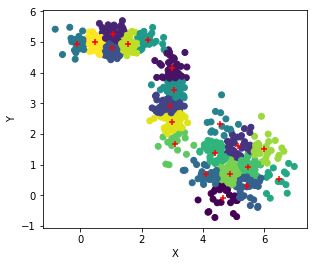

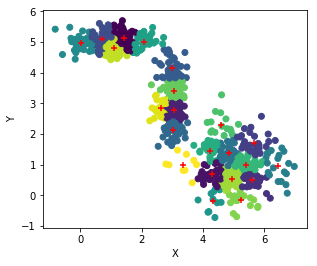

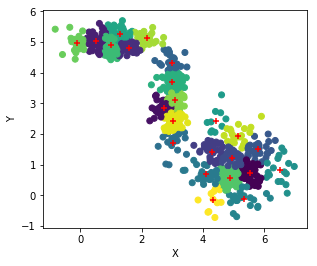

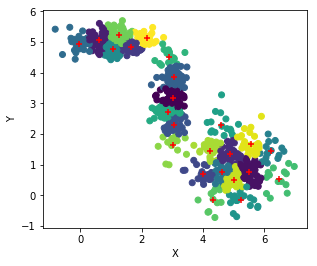

The lowest distortion is  68.90363132088868
This distortion was made with  24  clusters.


In [35]:
Xx = ds_8[['x', 'y']]
printClusterGraphs(Xx,maxCluster,ds_8)

In [ ]:
looks like 3 clusters. didnt see any other better fitting ones.